# 1. 모듈 load

In [7]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms, datasets
import torchvision.models as models
from torch.autograd import Variable

from PIL import Image

import re

# 2. 장치 확인

In [8]:
if torch.cuda.is_available():
    DEVICE = torch.device('cuda')
else:
    DEVICE = torch.device('cpu')
print(f'Using Pytorch Version: {torch.__version__}, Device: {DEVICE}')

Using Pytorch Version: 1.7.1, Device: cuda


# 3. 데이터 load

In [9]:
webtoons = pd.read_csv('data/webtoons.csv', encoding = 'euc-kr')

In [10]:
webtoons.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3057 entries, 0 to 3056
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  3057 non-null   int64 
 1   id          3057 non-null   int64 
 2   title       3057 non-null   object
 3   platform    3057 non-null   object
 4   thumbnail   3057 non-null   object
dtypes: int64(2), object(3)
memory usage: 119.5+ KB


In [11]:
webtoons = webtoons.drop('Unnamed: 0', axis=1)

## 3-1. 다운로드

In [12]:
def download_thumbs(webtoons):
    thumbs_path = []
    path = 'thumbs/'
    for _, (index, title, platform, url) in webtoons.iterrows():
        title = platform + '_' +str(index) + '.jpg'
        thumbs_path.append(title)
        title = path + title
        #!wget -q {url} -O {title}
        
    thumbs_byte = []
    for thumb in thumbs_path:
        try: 
            thumbs_byte.append(Image.open(path + thumb))
        except:
            thumbs_byte.append(0)
    
    return thumbs_path, thumbs_byte

In [13]:
thumbs_path, thumbs_byte = [], []
if len(thumbs_byte) != len(webtoons):
    thumbs_path, thumbs_byte = download_thumbs(webtoons)
print(thumbs_path[0], thumbs_byte[0])

naver_0.jpg <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=125x101 at 0x22EDC1E3A60>


# 4. 데이터 확인하기

In [14]:
print(f'Image: {len(thumbs_byte)}개')
print(f'Image Size: \n naver: {thumbs_byte[0].size}, daum: {thumbs_byte[1423].size}, kakao: {thumbs_byte[2230].size}')

Image: 3057개
Image Size: 
 naver: (125, 101), daum: (148, 106), kakao: (540, 540)


In [ ]:
pltsize = 2
plt.figure(figsize = (5 * pltsize, pltsize))

for i in range(5):
    plt.subplot(1, 5, i+1)
    plt.axis('off')
    plt.imshow(thumbs_byte[i])
    plt.title(f'title: {thumbs_path[i]}')

## 데이터 전처리

In [15]:
w, h = (224, 224)
mean_rgb = (0.485, 0.456, 0.406)
std_rgb = (0.229, 0.224, 0.225)


transformer = transforms.Compose([
                transforms.Resize((h,w)),
                transforms.ToTensor(),
                transforms.Normalize(mean_rgb, std_rgb)
])

# 이미지에 transformation 적용하기
dataset = []
for i in range(len(thumbs_byte)):
    if thumbs_byte[i].mode != "RGB":
        thumbs_byte[i] = thumbs_byte[i].convert("RGB")
    tmp = transformer(thumbs_byte[i])
    dataset.append(tmp)

C:\Users\gunso\anaconda3\envs\songah\lib\site-packages\PIL\Image.py:973: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


In [ ]:
pltsize = 2
plt.figure(figsize = (5 * pltsize, pltsize))

for i in range(5):
    plt.subplot(1, 5, i+1)
    plt.axis('off')
    plt.imshow(np.transpose(dataset[i], (1,2,0)))
    plt.title(f'title: {thumbs_path[i]}')

# 5. Pre-trained 모델 불러오기

In [16]:
model = models.resnet18(pretrained=True).to(DEVICE).eval()

In [17]:
layer = model._modules.get('avgpool')

In [18]:
model.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [19]:
def get_features(x, model):
    
    x = Variable(x)
    embedding = torch.zeros(512)
    def copy_data(module, inp, out):
        embedding.copy_(out.data.reshape(out.data.size(1)))
    
    h = layer.register_forward_hook(copy_data)
    model(x)
    h.remove()
    
    return embedding

In [20]:
def get_ith_loss(row, sim):
    
    row_tensor = dataset[row].unsqueeze(0).to(DEVICE)
    row_image = get_features(row_tensor, model)
    for col in range(len(dataset)):
        col_tensor = dataset[col].unsqueeze(0).to(DEVICE)
        col_image = get_features(col_tensor, model)
        cos = nn.CosineSimilarity(dim=1, eps=1e-6)
        sim[row, col] = cos(row_image.unsqueeze(0), col_image.unsqueeze(0))
    
    torch.cuda.empty_cache()
    return sim

In [71]:
def show_result(row, sim, cache):
    
    if cache[row] == 0:
        sim = get_ith_loss(row, sim)
        cache[row] = 1
    idx = np.argsort(sim[row])

    worst5 = idx[0:5]    
    best5 = idx[-6:][::-1][1:6]
    
    
    plt.axis('off')
    plt.imshow(thumbs_byte[row])
    
    pltsize = 2
    plt.figure(figsize = (5 * pltsize, pltsize))

    # best 5 결과
    for i in range(5):
        plt.subplot(1, 5, i+1)
        plt.axis('off')
        plt.imshow(thumbs_byte[best5[i]])
        plt.title(f'sim:{sim[row,best5[i]]:.2f}')
        #plt.title(f'{thumbs_path[best5[i]]}')
    
    pltsize = 2
    plt.figure(figsize = (5 * pltsize, pltsize))

    # worst 5 결과
    for i in range(5):
        plt.subplot(1, 5, i+1)
        plt.axis('off')
        plt.imshow(thumbs_byte[worst5[i]])
        plt.title(f'sim:{sim[row,worst5[i]]:.2f}')
        #plt.title(f'{thumbs_path[worst5[i]]}')
        
    return cache, sim

In [72]:
sim = np.zeros((len(dataset), len(dataset)))

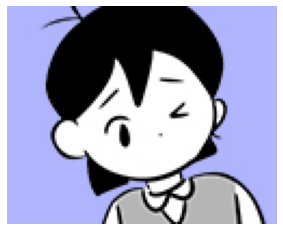

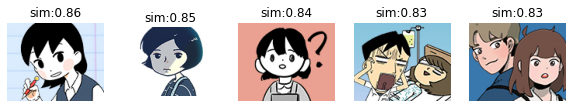

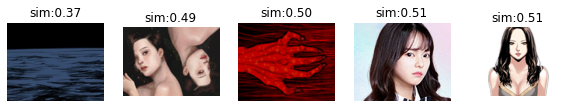

In [73]:
cache = np.zeros(len(dataset))
cache, sim = show_result(500, sim, cache)

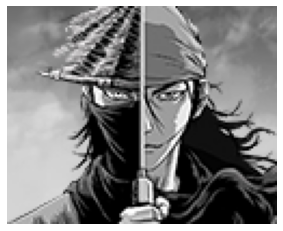

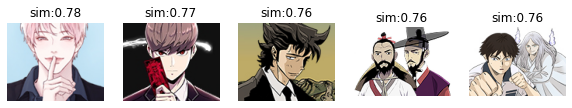

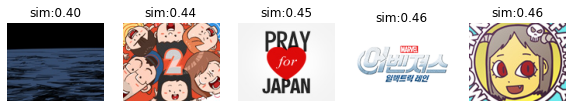

In [74]:
cache, sim = show_result(1000, sim, cache)

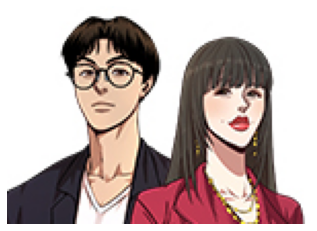

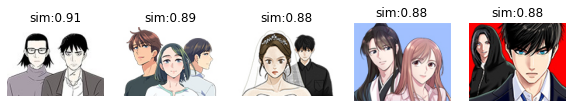

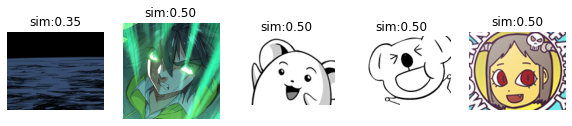

In [75]:
cache, sim = show_result(1500, sim, cache)

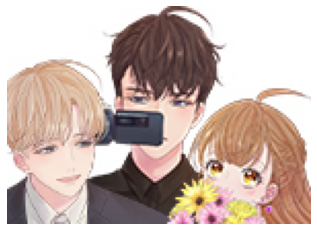

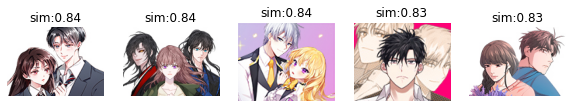

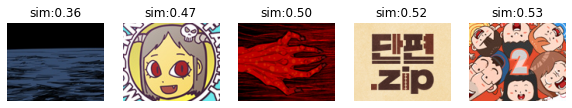

In [76]:
cache, sim = show_result(2000, sim, cache)

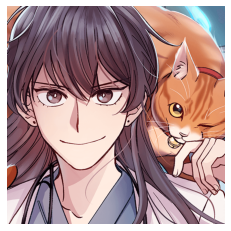

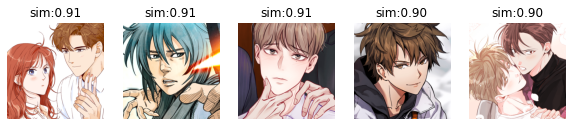

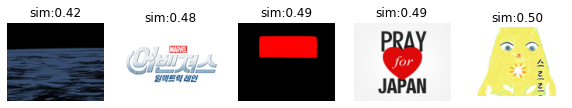

In [77]:
cache, sim = show_result(2500, sim, cache)

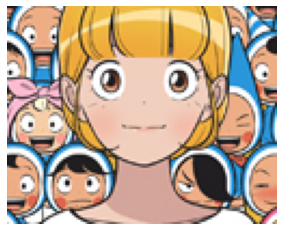

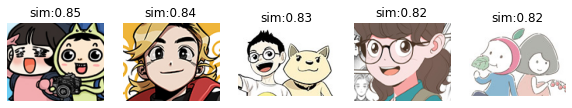

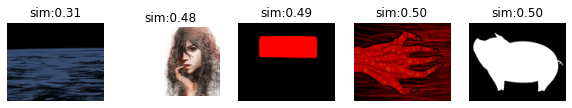

In [78]:
cache, sim = show_result(169, sim, cache)

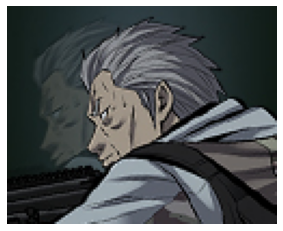

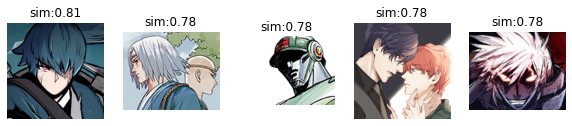

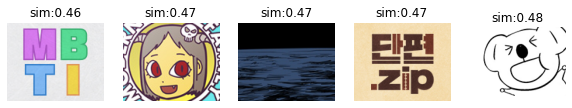

In [79]:
cache, sim = show_result(464, sim, cache)

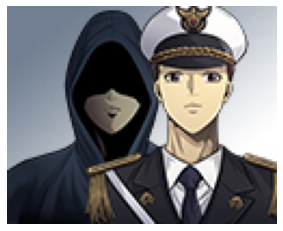

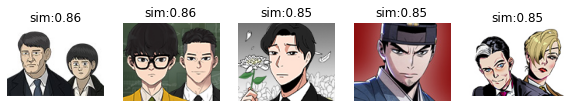

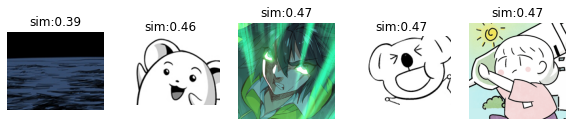

In [80]:
cache, sim = show_result(125, sim, cache)

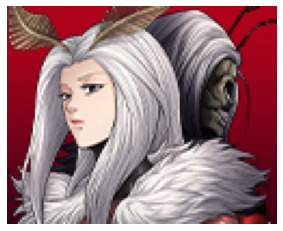

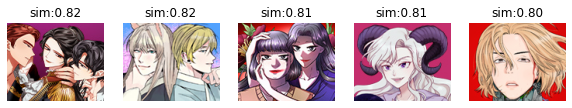

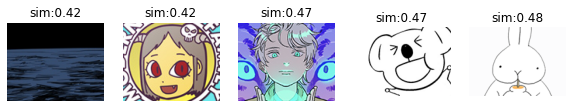

In [81]:
cache, sim = show_result(1244, sim, cache)

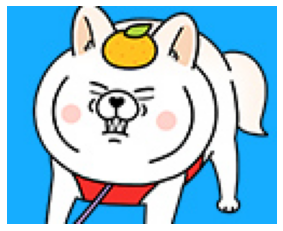

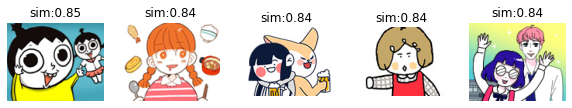

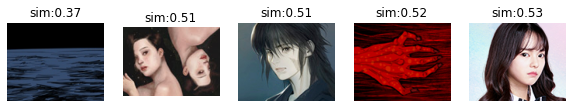

In [82]:
cache, sim = show_result(1133, sim, cache)

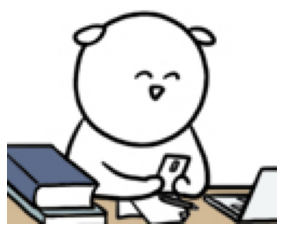

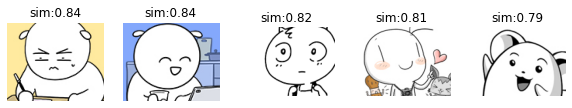

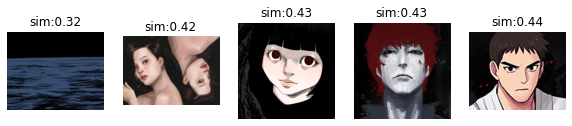

In [83]:
cache, sim = show_result(435, sim, cache)

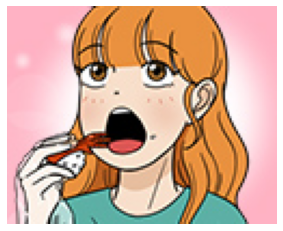

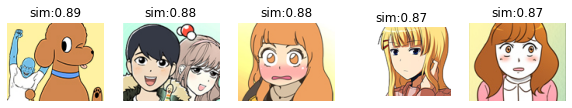

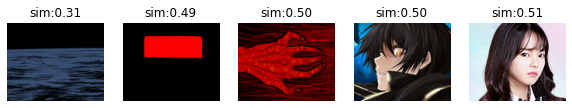

In [86]:
cache, sim = show_result(1385, sim, cache)

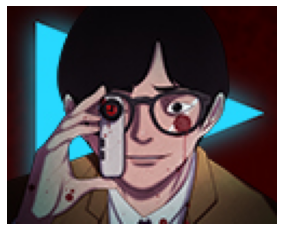

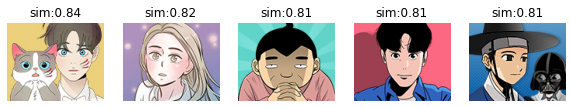

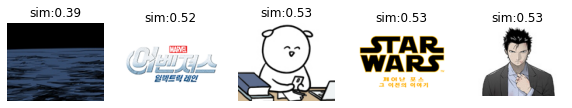

In [88]:
cache,sim = show_result(1293, sim, cache)

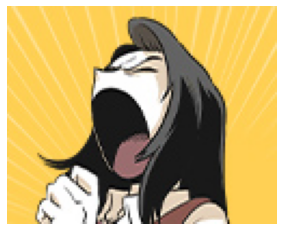

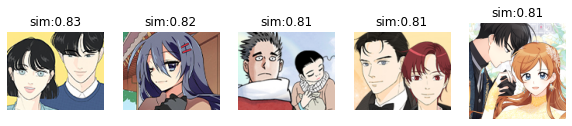

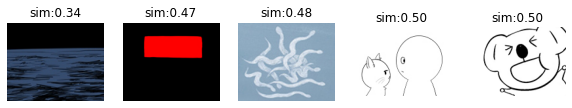

In [89]:
cache,sim = show_result(5, sim, cache)

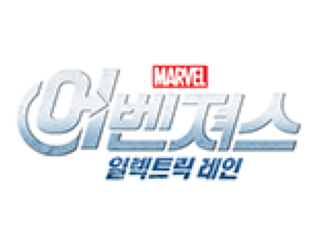

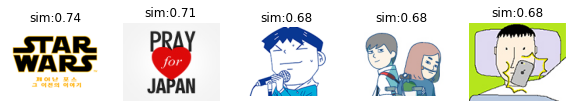

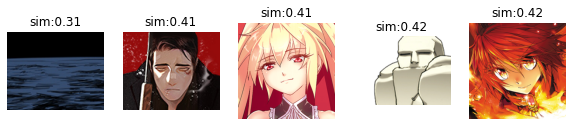

In [90]:
cache,sim = show_result(2129, sim, cache)

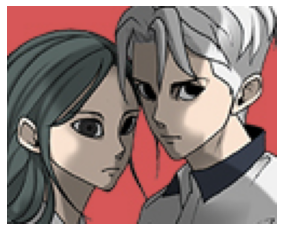

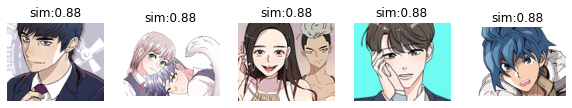

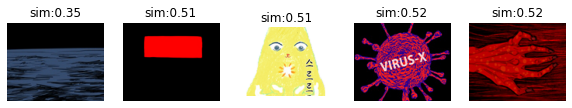

In [91]:
cache,sim = show_result(1382, sim, cache)

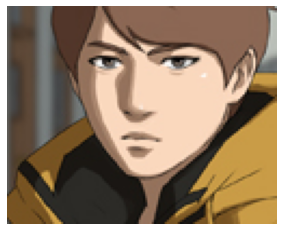

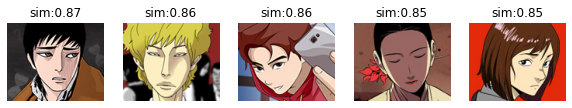

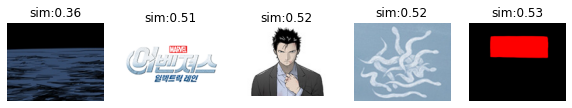

In [93]:
cache, sim = show_result(1305, sim, cache)

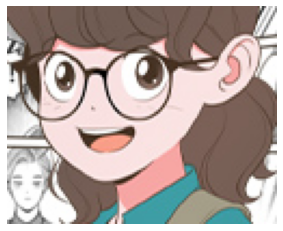

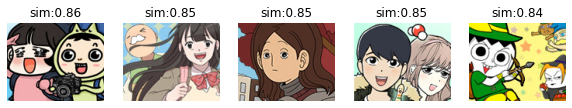

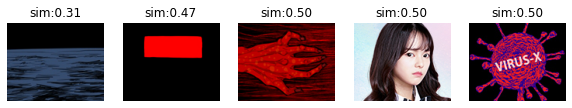

In [94]:
cache, sim = show_result(1154, sim, cache)

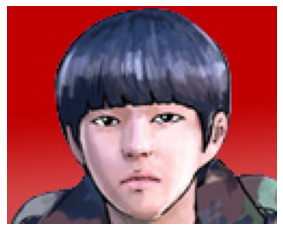

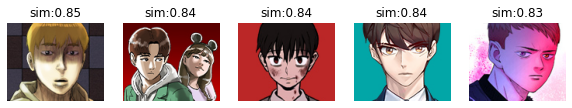

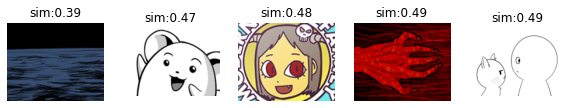

In [95]:
cache, sim = show_result(1123, sim, cache)

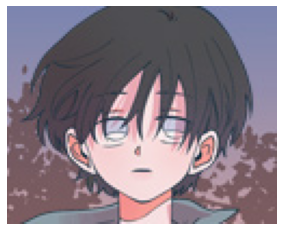

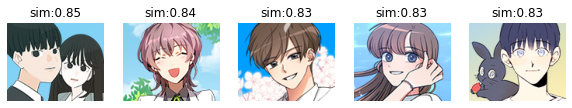

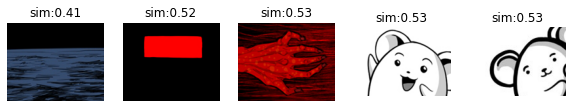

In [96]:
cache, sim = show_result(1101, sim, cache)

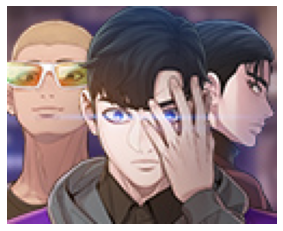

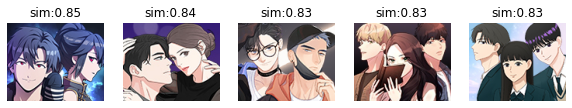

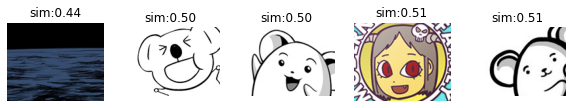

In [97]:
cache, sim = show_result(1001, sim, cache)

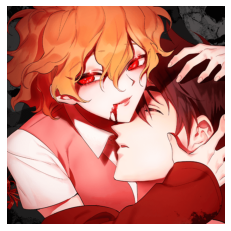

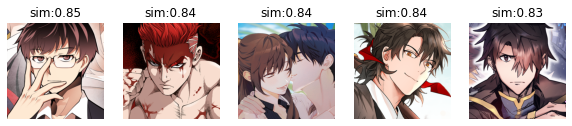

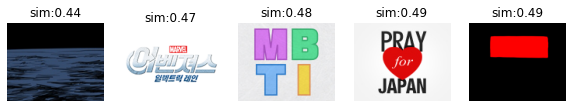

In [98]:
cache, sim = show_result(3000, sim, cache)

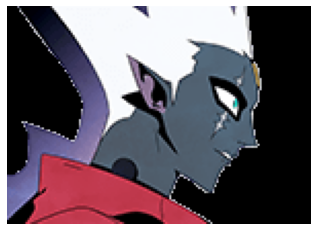

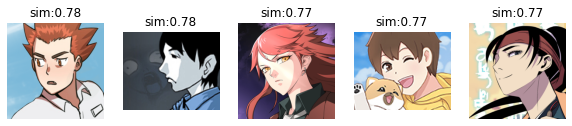

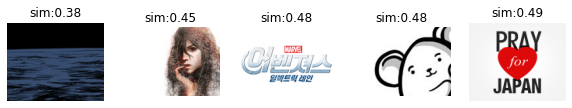

In [99]:
cache, sim = show_result(1550, sim, cache)

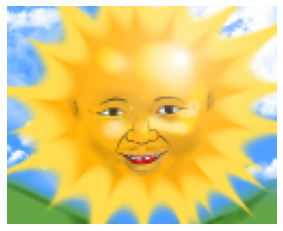

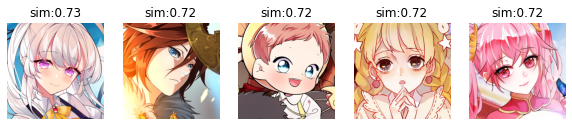

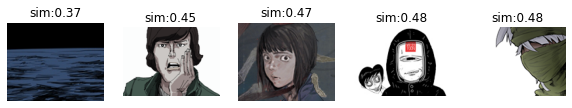

In [100]:
cache, sim = show_result(1149, sim, cache)

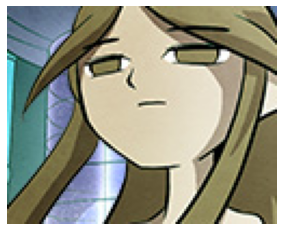

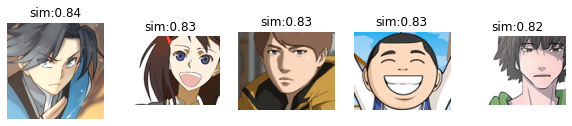

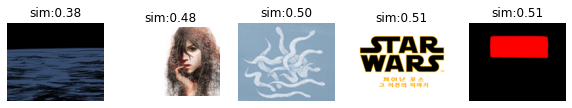

In [101]:
cache, sim = show_result(1023, sim, cache)

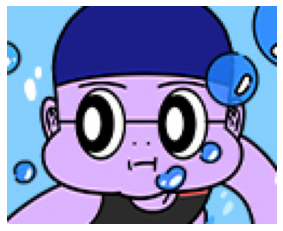

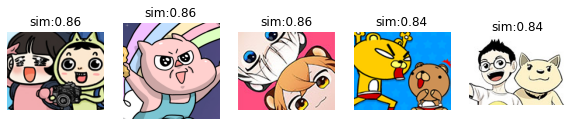

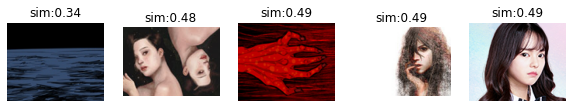

In [102]:
cache, sim = show_result(1016, sim, cache)

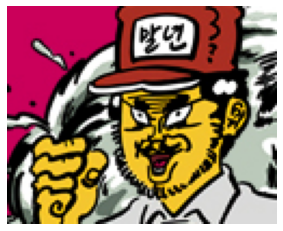

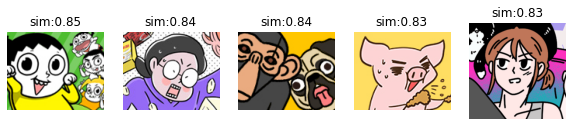

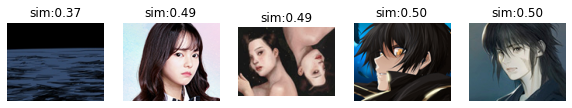

In [103]:
cache, sim = show_result(484, sim, cache)

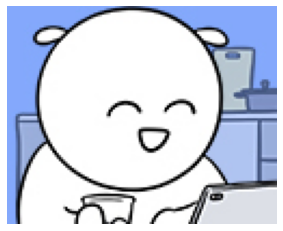

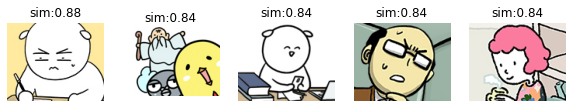

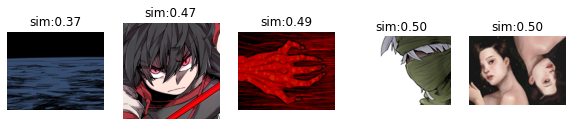

In [104]:
cache, sim = show_result(1186, sim, cache)

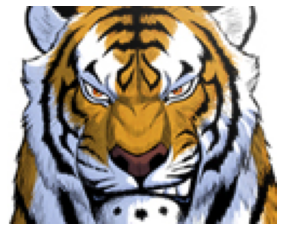

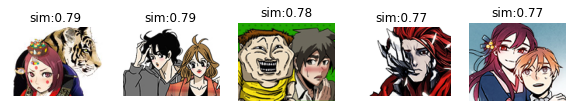

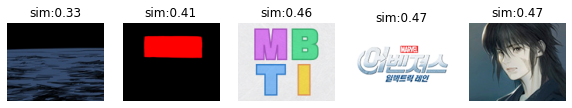

In [105]:
cache, sim = show_result(1304, sim, cache)

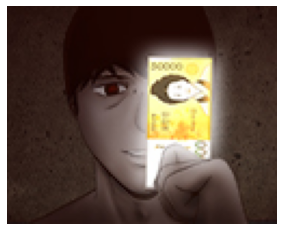

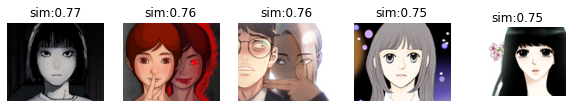

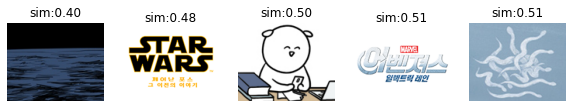

In [106]:
cache, sim = show_result(998, sim, cache)

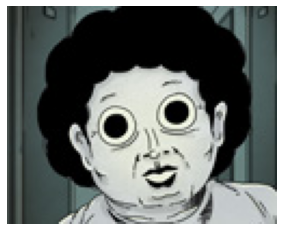

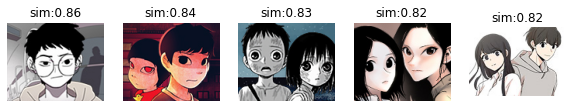

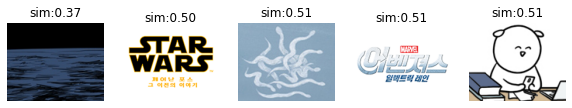

In [107]:
cache, sim = show_result(373, sim, cache)

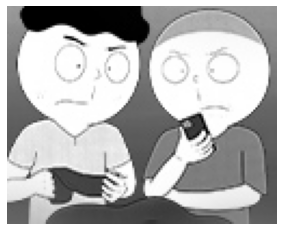

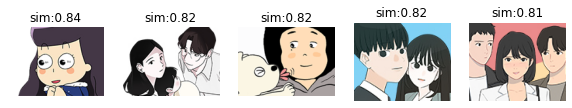

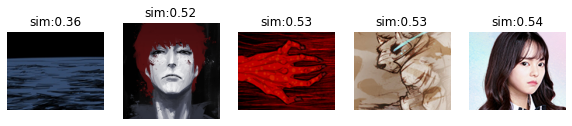

In [108]:
cache, sim = show_result(1277, sim, cache)

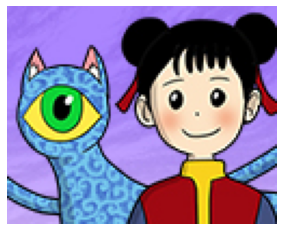

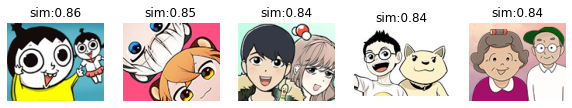

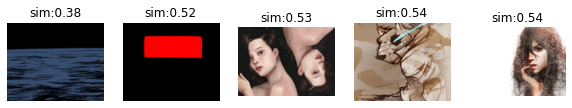

In [109]:
cache, sim = show_result(267, sim, cache)

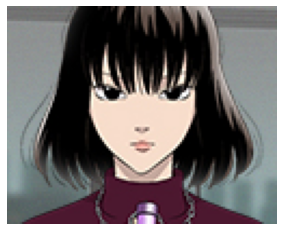

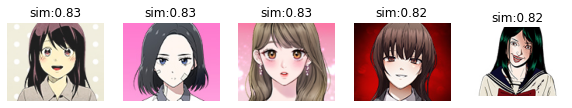

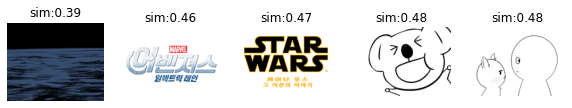

In [110]:
cache, sim = show_result(257, sim, cache)

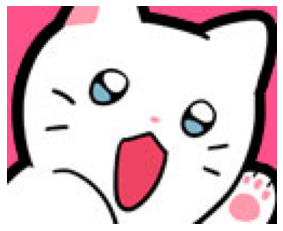

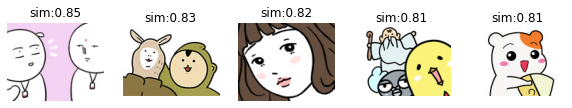

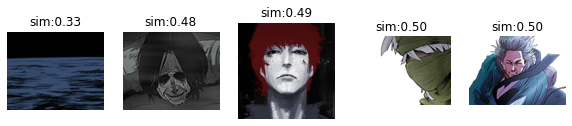

In [111]:
cache, sim = show_result(96, sim, cache)

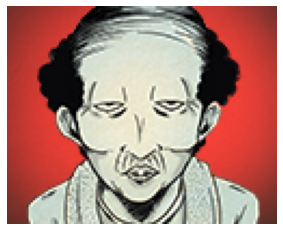

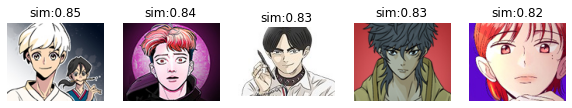

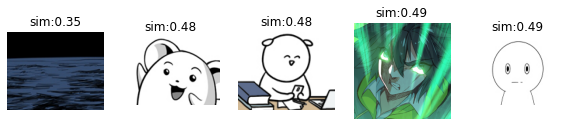

In [112]:
cache, sim = show_result(113, sim, cache)

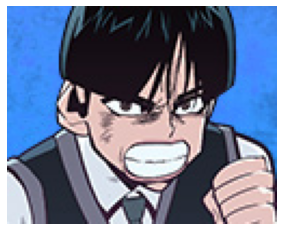

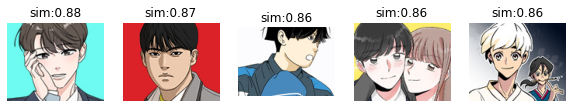

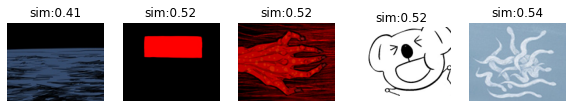

In [113]:
cache, sim = show_result(71, sim, cache)

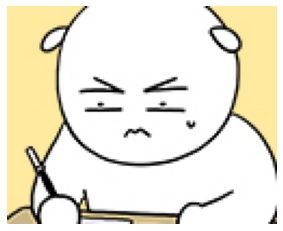

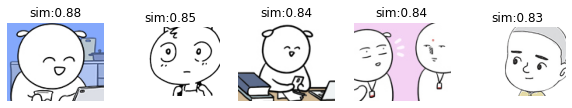

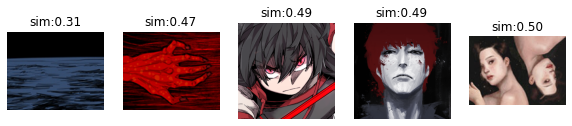

In [114]:
cache, sim = show_result(376, sim, cache)

## CNN Layer 별로 살펴보기

In [ ]:
def show_feature(features, layer):
    pltsize = 5
    plt.figure(figsize = (pltsize, pltsize))
    subs = np.transpose(features[layer].cpu().detach(), (1,2,3,0))
    for s, sub in enumerate(subs):
        '''try:
            plt.subplot(1,4,s+1)
        except:
            break
        plt.title(f'{s}')'''
        plt.axis('off')
        plt.imshow(sub)